숫자 feature에 대한 pairplot

In [1]:
import warnings
warnings.filterwarnings(action="ignore")
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [2]:
train_df = pd.read_parquet("../data/train.parquet").drop(columns="SAMPLE_ID")

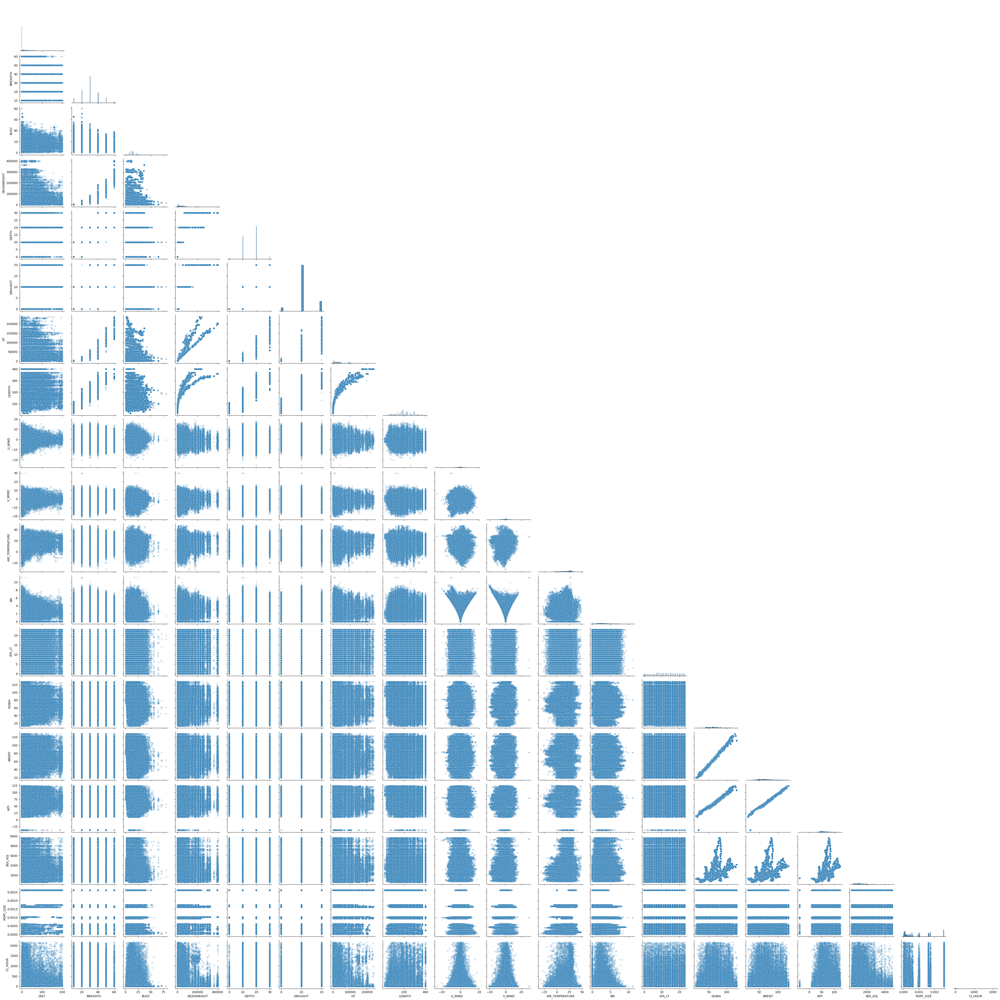

In [14]:
sns.pairplot(train_df, corner=True, plot_kws={"alpha": 0.2})
plt.show()

In [16]:
train_df.iloc[0]

ARI_CO                                         CN
ARI_PO                                       EKP8
SHIP_TYPE_CATEGORY                           Bulk
DIST                                    30.736578
ATA                               2020-10-15 4:03
ID                                        Z517571
BREADTH                                      30.0
BUILT                                          28
DEADWEIGHT                                  73100
DEPTH                                        20.0
DRAUGHT                                      10.0
GT                                          38600
LENGTH                                      220.0
SHIPMANAGER                                CHMT36
FLAG                  China, People's Republic Of
U_WIND                                       0.14
V_WIND                                       3.77
AIR_TEMPERATURE                              15.9
BN                                       2.730798
ATA_LT                                         12


In [17]:
df = train_df[["BREADTH", "BUILT", "DEADWEIGHT", "DEPTH", "DRAUGHT", "GT", "LENGTH", "U_WIND", "V_WIND", "AIR_TEMPERATURE", "BN", "ATA_LT", "DUBAI", "BRENT", "WTI", "BDI_ADJ", "PORT_SIZE", "CI_HOUR"]]
df.corr()

,BREADTH,BUILT,DEADWEIGHT,DEPTH,DRAUGHT,GT,LENGTH,U_WIND,V_WIND,AIR_TEMPERATURE,BN,ATA_LT,DUBAI,BRENT,WTI,BDI_ADJ,PORT_SIZE,CI_HOUR
BREADTH,1.000000,-0.209375,0.857017,0.790513,0.761375,0.903938,0.920609,-0.053628,0.022895,0.125191,0.086811,0.005880,-0.162380,-0.161773,-0.167849,-0.104851,0.036644,0.043974
BUILT,-0.209375,1.000000,-0.240538,-0.206096,-0.146999,-0.238323,-0.180347,0.011537,-0.008816,-0.035282,-0.012037,-0.009129,-0.094221,-0.093465,-0.095918,-0.066262,0.039832,0.001588
DEADWEIGHT,0.857017,-0.240538,1.000000,0.712965,0.813260,0.925234,0.826592,-0.029360,0.039366,0.084452,0.087457,0.007491,-0.101298,-0.101067,-0.105156,-0.064909,-0.139229,0.078274
DEPTH,0.790513,-0.206096,0.712965,1.000000,0.581236,0.787465,0.842580,-0.042028,0.031401,0.072682,0.073000,0.004621,-0.145419,-0.145375,-0.150481,-0.085423,0.019427,0.052184
DRAUGHT,0.761375,-0.146999,0.813260,0.581236,1.000000,0.778966,0.737686,-0.037623,0.025017,0.089710,0.086204,0.005626,-0.131950,-0.131380,-0.136169,-0.086688,-0.043841,0.040560
GT,0.903938,-0.238323,0.925234,0.787465,0.778966,1.000000,0.916535,-0.040441,0.023913,0.102416,0.072865,0.005458,-0.114787,-0.114408,-0.118547,-0.070511,0.018019,0.059959
LENGTH,0.920609,-0.180347,0.826592,0.842580,0.737686,0.916535,1.000000,-0.052930,0.023724,0.115006,0.079908,0.005498,-0.192615,-0.192114,-0.199035,-0.118064,0.085154,0.035531
U_WIND,-0.053628,0.011537,-0.029360,-0.042028,-0.037623,-0.040441,-0.052930,1.000000,0.094156,-0.112517,-0.095474,-0.011608,0.012408,0.014001,0.012644,-0.021563,-0.069156,-0.012149
V_WIND,0.022895,-0.008816,0.039366,0.031401,0.025017,0.023913,0.023724,0.094156,1.000000,0.186578,-0.182020,0.012562,0.042197,0.042429,0.043050,0.108812,0.012303,0.017608
AIR_TEMPERATURE,0.125191,-0.035282,0.084452,0.072682,0.089710,0.102416,0.115006,-0.112517,0.186578,1.000000,-0.003144,0.027280,0.033684,0.031186,0.031390,0.191762,0.220629,0.035520


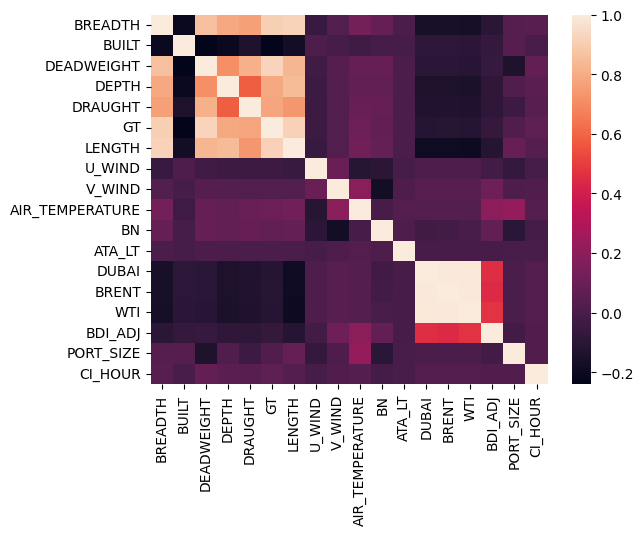

In [19]:
sns.heatmap(df.corr())
plt.show()

In [7]:
# drop : "U_WIND", "V_WIND", "AIR_TEMPERATURE"
df = train_df[["BREADTH", "BUILT", "DEADWEIGHT", "DEPTH", "DRAUGHT", "GT", "LENGTH", "BN", "ATA_LT", "DUBAI", "BRENT", "WTI", "BDI_ADJ", "PORT_SIZE", "CI_HOUR"]]
df.fillna(df.mean(), inplace=True)
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
vif["Features"] = df.columns
vif

,VIF_Factor,Features
0,69.009407,BREADTH
1,5.383728,BUILT
2,20.892214,DEADWEIGHT
3,29.703070,DEPTH
4,20.837236,DRAUGHT
5,26.941269,GT
6,94.805609,LENGTH
7,7.206505,BN
8,3.980390,ATA_LT
9,1146.597192,DUBAI
